In [ ]:
!pip install nltk

In [ ]:
import tensorflow as tf
import json
from time import time
import pickle
from keras.applications.vgg16 import VGG16
from keras.applications.resnet50 import ResNet50, preprocess_input,decode_predictions
from keras.preprocessing import image
from keras.models import Model, load_model
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from keras.layers import Input, Dense, Dropout, Embedding, LSTM
from keras.layers import concatenate
# from keras.layers import Merge
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import keras
import re
import nltk
from nltk.corpus import stopwords
import string


In [ ]:
# Read Text Captions
def readTextFile(path):
  with open(path) as f:
    captions = f.read()
  return captions

captions = readTextFile("/content/drive/MyDrive/image captioning/Flickr8k.token.txt")
# print(len(captions.split("\n")))
captions = captions.split("\n")[:-1]

In [ ]:
# print(len(captions))
print(captions[85])
first, second = captions[85].split('\t')
# second
# first.split('.')[0]

1022454428_b6b660a67b.jpg#0	A couple and an infant , being held by the male , sitting next to a pond with a near by stroller .


In [ ]:
# Dictionary to Map each Image with the list of caption it has

descriptions = {}

for x in captions:
  first, second = x.split('\t')
  img_name = first.split(".")[0]

  #if the image id is already present or not
  if descriptions.get(img_name) is None:
    descriptions[img_name] = []

  descriptions[img_name].append(second)

In [ ]:
descriptions['2091171488_c8512fec76']

['A female wearing pink gloves and a brown jacket is smiling in the snow .',
 'A woman standing in the snow with people in the background .',
 'A young woman in a spring coat and purple gloves stands in falling snow .',
 'A young woman looks happy in winter clothes while it snows .',
 'Young asian woman with pink gloves stands in the snow .']

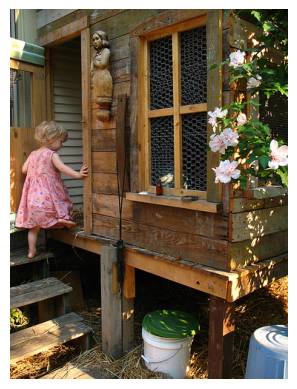

In [ ]:
img = cv2.imread("/content/drive/MyDrive/image captioning/Images/1000268201_693b08cb0e.jpg")
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis("off")
plt.show()

In [ ]:
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [ ]:
# from google.colab import drive


**Data Cleaning**

In [ ]:
def clean_text(sentence):
  sentence = sentence.lower()
  sentence = re.sub("[^a-z]+"," ",sentence)
  sentence = sentence.split()

  sentence = [s for s in sentence if len(s)>1]
  sentence = " ".join(sentence)
  return sentence

In [ ]:
clean_text("A cat is sitting over the house # 64")

'cat is sitting over the house'

In [ ]:
# Clean all Captions
for key,caption_list in descriptions.items():
  for i in range(len(caption_list)):
    caption_list[i] = clean_text(caption_list[i])

In [ ]:
descriptions['1000268201_693b08cb0e']

['child in pink dress is climbing up set of stairs in an entry way',
 'girl going into wooden building',
 'little girl climbing into wooden playhouse',
 'little girl climbing the stairs to her playhouse',
 'little girl in pink dress going into wooden cabin']

In [ ]:
with open("descriptions_1.txt","w") as f:
  f.write(str(descriptions))

**Vocabulary**

In [ ]:
import ast
descriptions = None
with open ("/content/descriptions_1.txt","r") as f:
  descriptions = f.read()

print(type(descriptions))




<class 'str'>


In [ ]:
# descriptions = ast.literal_eval(descriptions)
# print(type(descriptions))
descriptions
json_acceptable_string = descriptions.replace("'","\"")
descriptions = json.loads(json_acceptable_string)
print(type(descriptions))

<class 'dict'>


In [ ]:
# Vocab

vocab = set()
for key in descriptions.keys():
  [vocab.update(sentence.split()) for sentence in descriptions[key]]

In [ ]:
print("Vocab Size : %d"% len(vocab))
# vocab


Vocab Size : 8424


In [ ]:
# Total No of words across all the sentences
total_words = []

for key in descriptions.keys():
  [total_words.append(i) for des in descriptions[key] for i in des.split()]

In [ ]:
print("Total words %d"%len(total_words))

Total words 373837


In [ ]:
# Filter words from the vocab according to certain threshold frequency
import collections
counter = collections.Counter(total_words)
# print(counter)
freq_cnt = dict(counter)
print(freq_cnt)
type(freq_cnt)


{'child': 1545, 'in': 18987, 'pink': 739, 'dress': 348, 'is': 9345, 'climbing': 507, 'up': 1302, 'set': 109, 'of': 6723, 'stairs': 109, 'an': 2432, 'entry': 1, 'way': 53, 'girl': 3328, 'going': 149, 'into': 1074, 'wooden': 284, 'building': 511, 'little': 1768, 'playhouse': 6, 'the': 18420, 'to': 3176, 'her': 1178, 'cabin': 4, 'black': 3848, 'dog': 8138, 'and': 8863, 'spotted': 38, 'are': 3505, 'fighting': 133, 'tri': 14, 'colored': 221, 'playing': 2008, 'with': 7765, 'each': 430, 'other': 773, 'on': 10746, 'road': 398, 'white': 3959, 'brown': 2578, 'spots': 29, 'staring': 57, 'at': 2916, 'street': 944, 'two': 5643, 'dogs': 2125, 'different': 46, 'breeds': 5, 'looking': 744, 'pavement': 48, 'moving': 41, 'toward': 146, 'covered': 372, 'paint': 62, 'sits': 577, 'front': 1386, 'painted': 64, 'rainbow': 22, 'hands': 246, 'bowl': 30, 'sitting': 1368, 'large': 1237, 'small': 1278, 'grass': 1622, 'plays': 526, 'fingerpaints': 3, 'canvas': 6, 'it': 401, 'there': 304, 'pigtails': 14, 'painting'

dict

In [ ]:
# Sort this dictionary according to the freq count
sorted_freq_cnt = sorted(freq_cnt.items(),reverse=True,key=lambda x:x[1])

In [ ]:
print(sorted_freq_cnt)

[('in', 18987), ('the', 18420), ('on', 10746), ('is', 9345), ('and', 8863), ('dog', 8138), ('with', 7765), ('man', 7275), ('of', 6723), ('two', 5643), ('white', 3959), ('black', 3848), ('boy', 3581), ('are', 3505), ('woman', 3403), ('girl', 3328), ('to', 3176), ('wearing', 3062), ('at', 2916), ('people', 2887), ('water', 2790), ('red', 2691), ('young', 2630), ('brown', 2578), ('an', 2432), ('his', 2357), ('blue', 2279), ('dogs', 2125), ('running', 2073), ('through', 2032), ('playing', 2008), ('while', 1968), ('shirt', 1962), ('down', 1843), ('standing', 1789), ('ball', 1783), ('little', 1768), ('grass', 1622), ('snow', 1547), ('child', 1545), ('person', 1542), ('jumping', 1473), ('over', 1415), ('three', 1389), ('front', 1386), ('sitting', 1368), ('holding', 1324), ('up', 1302), ('field', 1283), ('small', 1278), ('by', 1249), ('large', 1237), ('green', 1234), ('one', 1223), ('group', 1218), ('yellow', 1217), ('her', 1178), ('walking', 1165), ('children', 1156), ('men', 1121), ('into', 

In [ ]:
# Filter
threshold = 10
sorted_freq_cnt = [x for x in sorted_freq_cnt if x[1]>threshold]
total_words = [x[0] for x in sorted_freq_cnt]

In [ ]:
len(total_words)
# total_words


1845

**Prepare Train/Test Data**

In [ ]:
train_file_data = readTextFile('/content/drive/MyDrive/image captioning/Flickr_8k.trainImages.txt')
test_file_data = readTextFile('/content/drive/MyDrive/image captioning/Flickr_8k.testImages.txt')


In [ ]:
train = [row.split(".")[0] for row in train_file_data.split('\n')[:-1]]
test = [row.split(".")[0] for row in test_file_data.split('\n')[:-1]]

In [ ]:
# Prepare Description for the Training Data
# Tweak - Add <s> and <e> token to our training data

train_descriptions = {}

for img_id in train:
  train_descriptions[img_id] = []
  for cap in descriptions[img_id]:
    cap_to_append = "startseq " + cap +" endseq"
    train_descriptions[img_id].append(cap_to_append)

In [ ]:
train_descriptions['1000268201_693b08cb0e']

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq']

**Tranfer Learning**

*   Images --> Features
*   Text --> Features



**Step - 1 Image Feature Extraction**

In [ ]:
model = ResNet50(weights='imagenet',input_shape=(224,224,3))
model.summary()

102967424/102967424 [==============================] - 1s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                    

In [ ]:
model.layers[-2].output

<KerasTensor: shape=(None, 2048) dtype=float32 (created by layer 'avg_pool')>

In [ ]:
model_new = Model(model.input,model.layers[-2].output)

In [ ]:
def preprocess_img(img):
  img = image.load_img(img,target_size=(224,224))
  img = image.img_to_array(img)
  img = np.expand_dims(img,axis=0)
  # Normalisation
  img = preprocess_input(img)
  return img

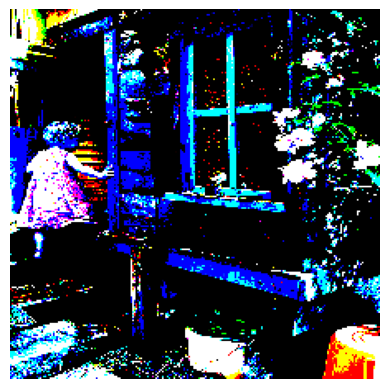

In [ ]:
img = preprocess_img('/content/drive/MyDrive/image captioning/Images/1000268201_693b08cb0e.jpg')
plt.imshow(img[0])
plt.axis("off")
plt.show()
# print(img)

In [ ]:
def encode_image(img):
  img = preprocess_img(img)
  feature_vector = model_new.predict(img)
  feature_vector = feature_vector.reshape((-1,))
  print(feature_vector.shape)
  return feature_vector

In [ ]:
encode_image('/content/drive/MyDrive/image captioning/Images/1000268201_693b08cb0e.jpg')

1/1 [==============================] - 2s 2s/step
(2048,)


array([0.06536547, 0.1678271 , 0.32518455, ..., 0.05111531, 0.32817906,
       1.0043341 ], dtype=float32)

In [ ]:
# start = time()
# encoding_train = {}
# #img_id -->feature_vector extracted from Resnet Image

# for ix,img_id in enumerate(train):
#   img_path = '/content/drive/MyDrive/image captioning/Images/' + img_id + ".jpg"
#   encoding_train[img_id] = encode_image(img_path)

#   if i%100 == 0:
#     print("Encoding in Progress Time step %d "%ix)

#   end_t = time()
#   print("Total Time Taken :",end_t-start)

In [ ]:
len(train)

6000

In [ ]:
# # Store everything to the disk
# with open("encode_train_features.pkl","wb") as f:
#   pickle.dump(encoding_train,f)

In [ ]:
# start = time()
# encoding_test = {}
# #img_id -->feature_vector extracted from Resnet Image

# for ix,img_id in enumerate(test):
#   img_path = '/content/drive/MyDrive/image captioning/Images/' + img_id + ".jpg"
#   encoding_test[img_id] = encode_image(img_path)

#   if i%100 == 0:
#     print("Encoding in Progress Time step %d "%ix)

#   end_t = time()
#   print("Total Time Taken :",end_t-start)

In [ ]:
# # Store everything to the disk
# with open("encode_test_features.pkl","wb") as f:
#   pickle.dump(encoding_test,f)

**Data pre-processing for Captions**

In [ ]:
len(total_words)

1845

In [ ]:
word_to_idx = {}
idx_to_word = {}

for i,word in enumerate(total_words):
  word_to_idx[word] = i+1
  idx_to_word[i+1] = word

In [ ]:
word_to_idx["dog"]
# idx_to_word[1]
# print(len(idx_to_word))
# idx_to_word

6

In [ ]:
#Two special words
idx_to_word[1846] = 'startseq'
word_to_idx['startseq'] = 1846

idx_to_word[1847] = 'endseq'
word_to_idx['endseq'] = 1847

vocab_size = len(word_to_idx) + 1
print("Vocab Size",vocab_size)
print(train_descriptions)

Vocab Size 1848
{'2513260012_03d33305cf': ['startseq black dog is running after white dog in the snow endseq', 'startseq black dog chasing brown dog through snow endseq', 'startseq two dogs chase each other across the snowy ground endseq', 'startseq two dogs play together in the snow endseq', 'startseq two dogs running through low lying body of water endseq'], '2903617548_d3e38d7f88': ['startseq little baby plays croquet endseq', 'startseq little girl plays croquet next to truck endseq', 'startseq the child is playing croquette by the truck endseq', 'startseq the kid is in front of car with put and ball endseq', 'startseq the little boy is playing with croquet hammer and ball beside the car endseq'], '3338291921_fe7ae0c8f8': ['startseq brown dog in the snow has something hot pink in its mouth endseq', 'startseq brown dog in the snow holding pink hat endseq', 'startseq brown dog is holding pink shirt in the snow endseq', 'startseq dog is carrying something pink in its mouth while walkin

In [ ]:
#Fixed max_len for entire training set
max_len = 0
for key in train_descriptions.keys():
  for cap in train_descriptions[key]:
    max_len = max(max_len,len(cap.split()))


In [ ]:
print(max_len)

35


**Data loader(Generator)**

In [ ]:
def data_generator(train_desriptions,encoding_train,word_to_idx,max_len,batch_size):
  x1,x2,y = [],[],[]

  n = 0
  while True:
    for key,desc_list in train_descriptions.items():
      n += 1

      photo = encoding_train[key]
      for desc in desc_list:

        seq = [word_to_idx[word] for word in desc.split() if word in word_to_idx]
        for i in range(1,len(seq)):
          xi = seq[0:i]
          yi = seq[i]

          #0 denote padding word
          xi = pad_sequences([xi],maxlen=max_len,value=0,padding='post')[0]
          yi = to_categorical([yi],num_classes=vocab_size)[0]

          x1.append(photo)
          x2.append(yi)
          y.append(yi)

      if n==batch_size:
        yield [[np.array(x1),np.array(x2)],np.array(y)]
        x1,x2,y = [],[],[]
        n = 0

**Word Embeddings**

In [ ]:
f = open('/content/drive/MyDrive/image captioning/glove.6B.50d.txt',encoding='utf8')

In [ ]:
embedding_index = {}

for line in f:
  values = line.split()
  word = values[0]
  word_embedding = np.array(values[1:],dtype='float')
  embedding_index[word] = word_embedding

In [ ]:
embedding_index['apple']

array([ 0.52042 , -0.8314  ,  0.49961 ,  1.2893  ,  0.1151  ,  0.057521,
       -1.3753  , -0.97313 ,  0.18346 ,  0.47672 , -0.15112 ,  0.35532 ,
        0.25912 , -0.77857 ,  0.52181 ,  0.47695 , -1.4251  ,  0.858   ,
        0.59821 , -1.0903  ,  0.33574 , -0.60891 ,  0.41742 ,  0.21569 ,
       -0.07417 , -0.5822  , -0.4502  ,  0.17253 ,  0.16448 , -0.38413 ,
        2.3283  , -0.66682 , -0.58181 ,  0.74389 ,  0.095015, -0.47865 ,
       -0.84591 ,  0.38704 ,  0.23693 , -1.5523  ,  0.64802 , -0.16521 ,
       -1.4719  , -0.16224 ,  0.79857 ,  0.97391 ,  0.40027 , -0.21912 ,
       -0.30938 ,  0.26581 ])

In [ ]:
f.close()

In [ ]:
def get_embedding_matrix():
  emb_dim = 50
  matrix = np.zeros((vocab_size,emb_dim))
  for word,idx in word_to_idx.items():
    embedding_vector = embedding_index.get(word)

    if embedding_vector is not None:
      matrix[idx] = embedding_vector

  return matrix

In [ ]:
embedding_matrix = get_embedding_matrix()
embedding_matrix.shape

(1848, 50)

In [ ]:
# embedding_matrix[1847]

**Model Architecture**

In [ ]:
input_img_features = Input(shape=(2048,))
inp_img1 = Dropout(0.3)(input_img_features)
inp_img2 = Dense(256,activation='relu')(inp_img1)

In [ ]:
# captions as Input
input_captions = Input(shape=(max_len,))
inp_cap1 = Embedding(input_dim=vocab_size,output_dim=50,mask_zero=True)(input_captions)
inp_cap2 = Dropout(0.3)(inp_cap1)
inp_cap3 = LSTM(256)(inp_cap2)

In [ ]:
#  from keras.layers import add
decoder1 = concatenate([inp_img2,inp_cap3])
decoder2 = Dense(256,activation='relu')(decoder1)
outputs = Dense(vocab_size,activation='softmax')(decoder2)

In [ ]:
# Combined Model
model = Model(inputs=[input_img_features,input_captions],outputs=outputs)

In [ ]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_3 (InputLayer)        [(None, 35)]                 0         []                            
                                                                                                  
 input_2 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding (Embedding)       (None, 35, 50)               92400     ['input_3[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 2048)                 0         ['input_2[0][0]']             
                                                                                            

In [ ]:
# Import Thing - Embedding Layer
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [ ]:
model.compile(loss='categorical_crossentropy',optimizer="adam")

**Training of Model**

In [ ]:
data = open("/content/drive/MyDrive/image captioning/encode_train_features.pkl",'rb')
encoding_train = pickle.load(data)
epochs = 20
number_pics_per_batch = 3
steps = len(train_descriptions)//number_pics_per_batch

In [ ]:
encoding_train['2513260012_03d33305cf'].shape

(2048,)

In [ ]:


# for i in range(epochs):
#   generator = data_generator(train_descriptions,encoding_train,word_to_idx,max_len,number_pics_per_batch)
#   model.fit(generator,epochs=1,steps_per_epoch=steps,verbose=1)
#   model.save('/content/drive/MyDrive/image captioning/model_weights/model_' + str(i) + '.h5')

In [ ]:
model = load_model('/content/drive/MyDrive/image captioning/model_weights/model_9.h5')

In [ ]:
def predict_caption(photo):

    in_text = "startseq"
    for i in range(max_len):
        sequence = [word_to_idx[w] for w in in_text.split() if w in word_to_idx]
        sequence = pad_sequences([sequence],maxlen=max_len,padding='post')

        ypred = model.predict([photo,sequence])
        ypred = ypred.argmax() #WOrd with max prob always - Greedy Sampling
        word = idx_to_word[ypred]
        in_text += (' ' + word)

        if word == "endseq":
            break

    final_caption = in_text.split()[1:-1]
    final_caption = ' '.join(final_caption)
    return final_caption

In [ ]:
data = open("/content/drive/MyDrive/image captioning/encode_test_features.pkl",'rb')
encoding_test = pickle.load(data)

In [ ]:
encoding_test['2373234213_4ebe9c4ee5']

array([0.11510538, 0.66917235, 1.1812088 , ..., 0.40479115, 0.19626796,
       0.66873753], dtype=float32)

<ipython-input-70-80eedc5410d0>:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


1/1 [==============================] - 0s 47ms/step


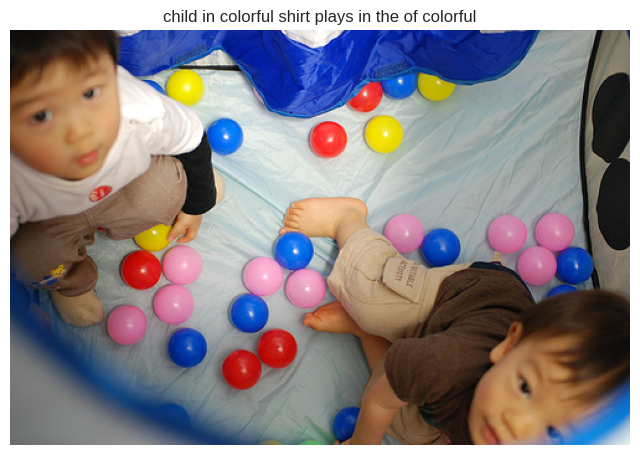

1/1 [==============================] - 0s 41ms/step


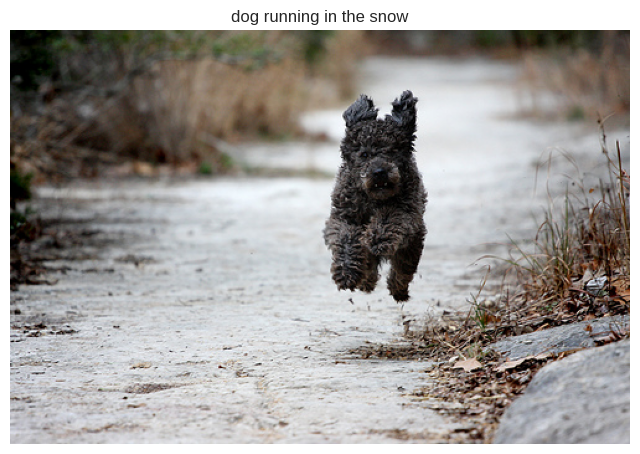

1/1 [==============================] - 0s 47ms/step


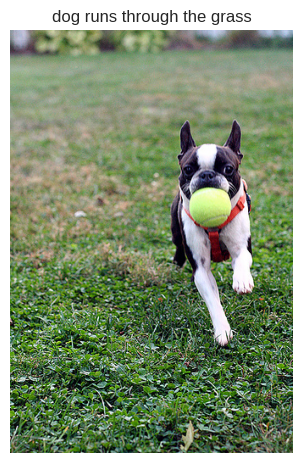

1/1 [==============================] - 0s 48ms/step


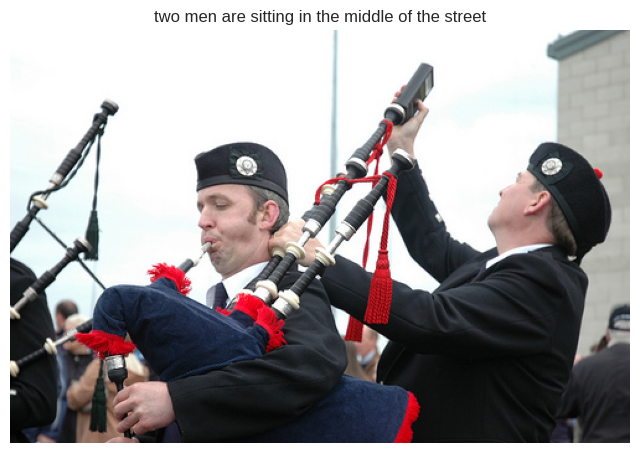

1/1 [==============================] - 0s 46ms/step


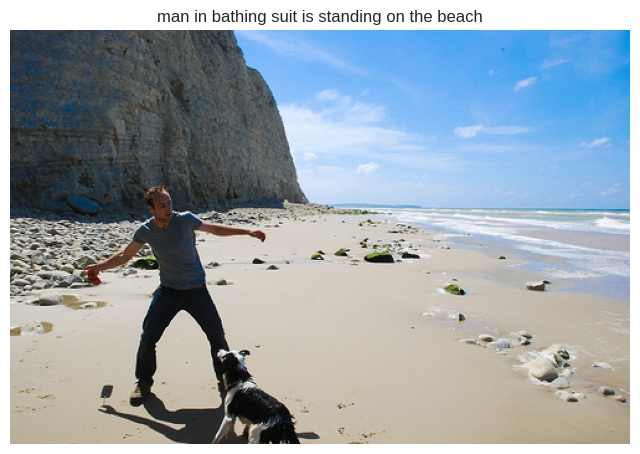

1/1 [==============================] - 0s 72ms/step


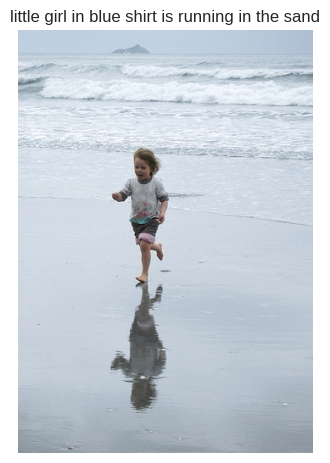

1/1 [==============================] - 0s 92ms/step


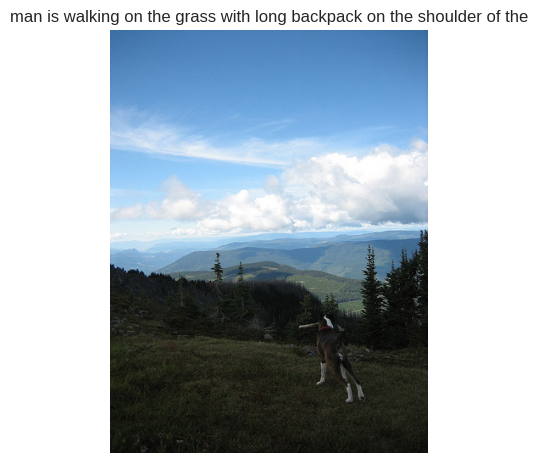

1/1 [==============================] - 0s 51ms/step


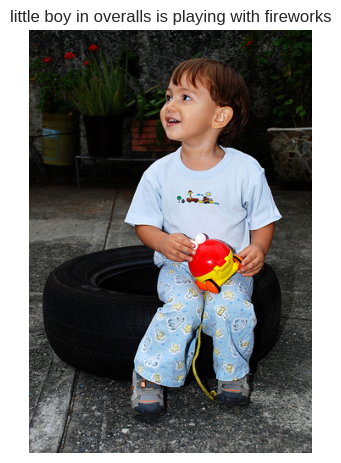

1/1 [==============================] - 0s 59ms/step


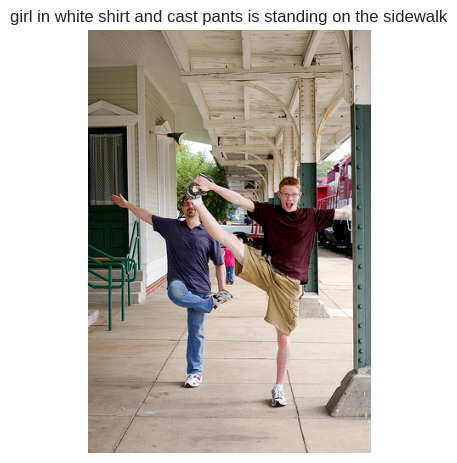

1/1 [==============================] - 0s 62ms/step


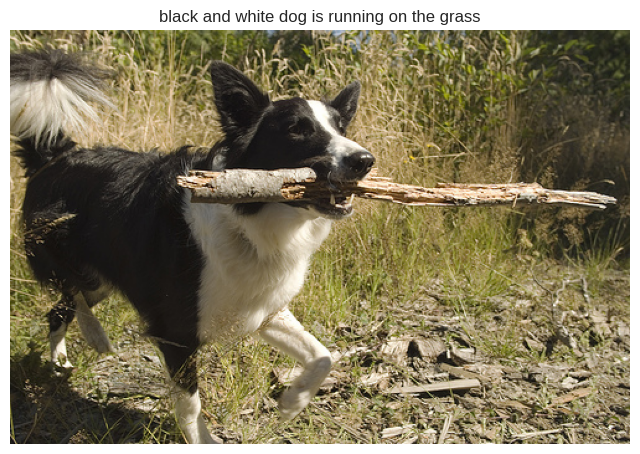

1/1 [==============================] - 0s 70ms/step


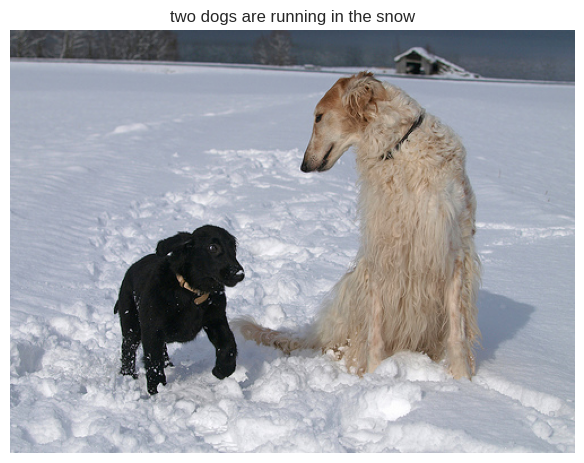

1/1 [==============================] - 0s 68ms/step


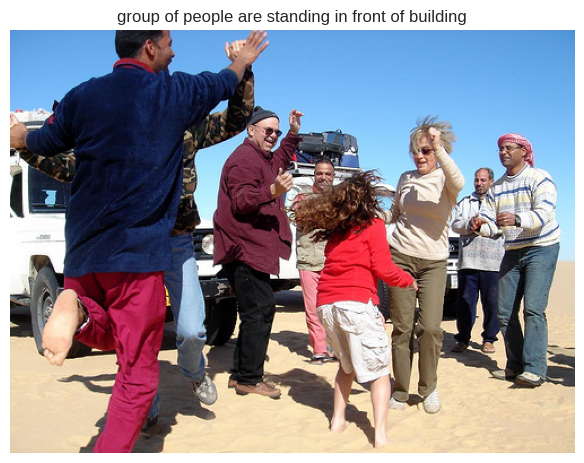

1/1 [==============================] - 0s 77ms/step


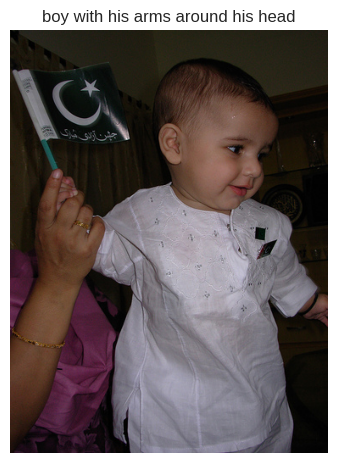

1/1 [==============================] - 0s 95ms/step


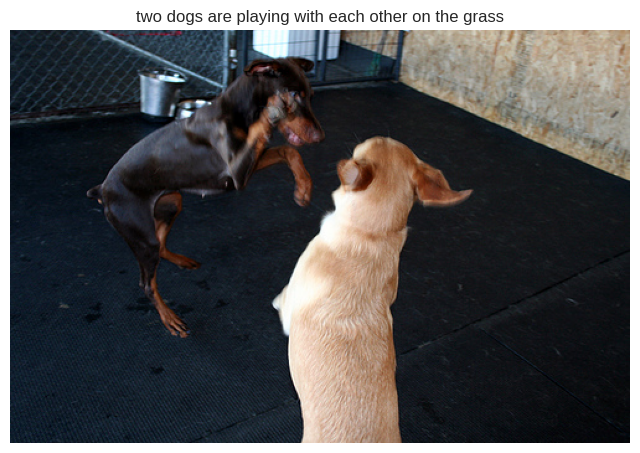

1/1 [==============================] - 0s 102ms/step


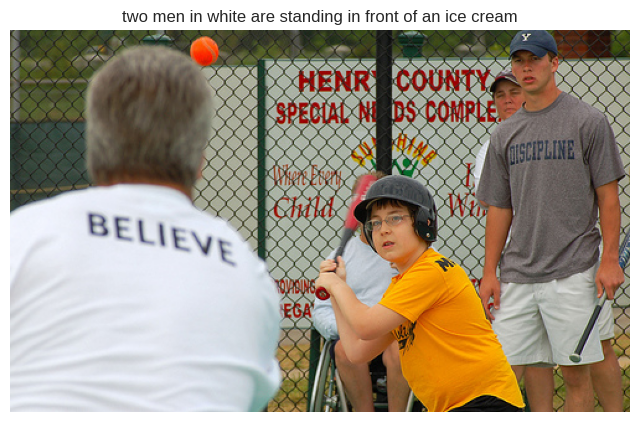

In [ ]:
# Pick Some Random Images and See Results
plt.style.use("seaborn")
for i in range(15):
    idx = np.random.randint(0,1000)
    all_img_names = list(encoding_test.keys())
    img_name = all_img_names[idx]
    photo_2048 = encoding_test[img_name].reshape((1,2048))

    i = plt.imread("/content/drive/MyDrive/image captioning/Images/"+img_name+".jpg")

    caption = predict_caption(photo_2048)
    #print(caption)

    plt.title(caption)
    plt.imshow(i)
    plt.axis("off")
    plt.show()
